In [51]:
!pip install uvicorn

In [1]:
# Installing ultralytics to use yolo_v8
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.0/793.0 kB 19.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [2]:
pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.1/296.1 kB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.8 MB/s eta 0:00:00


In [3]:
# Importing necessary libraries
import os
import shutil
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np
import copy
import wandb

In [4]:
from ultralytics import YOLO
secret_value_0 ="your_api_key" # you can get you personal key at
wandb.login(key=secret_value_0)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [5]:
# Defining data path and listing its contents
ip_datapath='/Project/African Wildlife' # The data set can be downloaded from https://www.kaggle.com/balraj98/african-wildlife
os.listdir(ip_datapath)

['rhino', 'elephant', 'buffalo', 'zebra']

In [6]:
# Defining standard image size for YOLO v8
image_size=640

# 1. Create directories

In [7]:
# Creating paths for separate images and labels
curr_path=os.getcwd() # Get current working directory
# Define Paths for Images
imgtrainpath = os.path.join(curr_path,'images','train')
imgvalpath=os.path.join(curr_path,'images','validation')
imgtestpath=os.path.join(curr_path,'images','test')
# Define Paths for Labels
labeltrainpath=os.path.join(curr_path,'labels','train')
labelvalpath=os.path.join(curr_path,'labels','validation')
labeltestpath=os.path.join(curr_path,'labels','test')

# Creating directories for all paths defined
os.makedirs(imgtrainpath)
os.makedirs(imgvalpath)
os.makedirs(imgtestpath)
os.makedirs(labeltrainpath)
os.makedirs(labelvalpath)
os.makedirs(labeltestpath)

In [8]:
# Process each directory in the input data path
for dirname in os.listdir(ip_datapath):
    dirpath=os.path.join(ip_datapath, dirname)
    # Process each file in the directory
    for file in os.listdir(dirpath):
        filepath=os.path.join(dirpath, file)
        newname=dirname+'_'+file
        if file.endswith((".txt")): # if label file, take it to label train path
            shutil.copy(filepath, labeltrainpath)
            path=os.path.join(labeltrainpath, file)
            newpath=os.path.join(labeltrainpath, newname)
        elif file.endswith((".jpg", ".JPG")): # if image file, resize and take it to image train path
            img_resized=cv2.resize(cv2.imread(filepath), (image_size, image_size))
            path=os.path.join(imgtrainpath, file)
            cv2.imwrite(path, img_resized)
            newpath=os.path.join(imgtrainpath, newname)
        os.rename(path, newpath) # Rename the file (label or image)

In [9]:
# Checking the number of image and label files for all classes
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1504, 1504)

In [10]:
# function to check if all elements in the list are actually the same
def are_all_elements_same(lst):
    if not lst:
        return True  # An empty list is considered to have all elements the same.

    first_element = lst[0]
    for element in lst[1:]:
        if element != first_element:
            return False

    return True

In [11]:
for file in os.listdir(labeltrainpath):
    classes_list=[]
    with open(os.path.join(labeltrainpath, file), "r") as f:
        for line in f:
            class_id,_,_,_,_=line.strip().split(" ")
            classes_list.append(class_id) # creating list of all unique animal types in given image

    # Checking if different types of animals are present in image
    if not are_all_elements_same(classes_list):
        filepath=os.path.join(labeltrainpath, file)
        newpath=os.path.join(labeltestpath, file)
        shutil.move(filepath, newpath) # moving label file to test path
        basename=os.path.splitext(file)[0]
        print(basename) # printing the image name
        imgfilename=basename+'.jpg'
        oldimgfilepath=os.path.join(imgtrainpath, imgfilename)
        newimgfilepath=os.path.join(imgtestpath, imgfilename)
        shutil.move(oldimgfilepath, newimgfilepath) # moving image to test path

buffalo_297
elephant_290
buffalo_273
elephant_291
zebra_073
zebra_339
elephant_345
buffalo_300
buffalo_299
elephant_166
buffalo_301
buffalo_291
rhino_238
elephant_288
buffalo_298
zebra_338
rhino_256
rhino_375


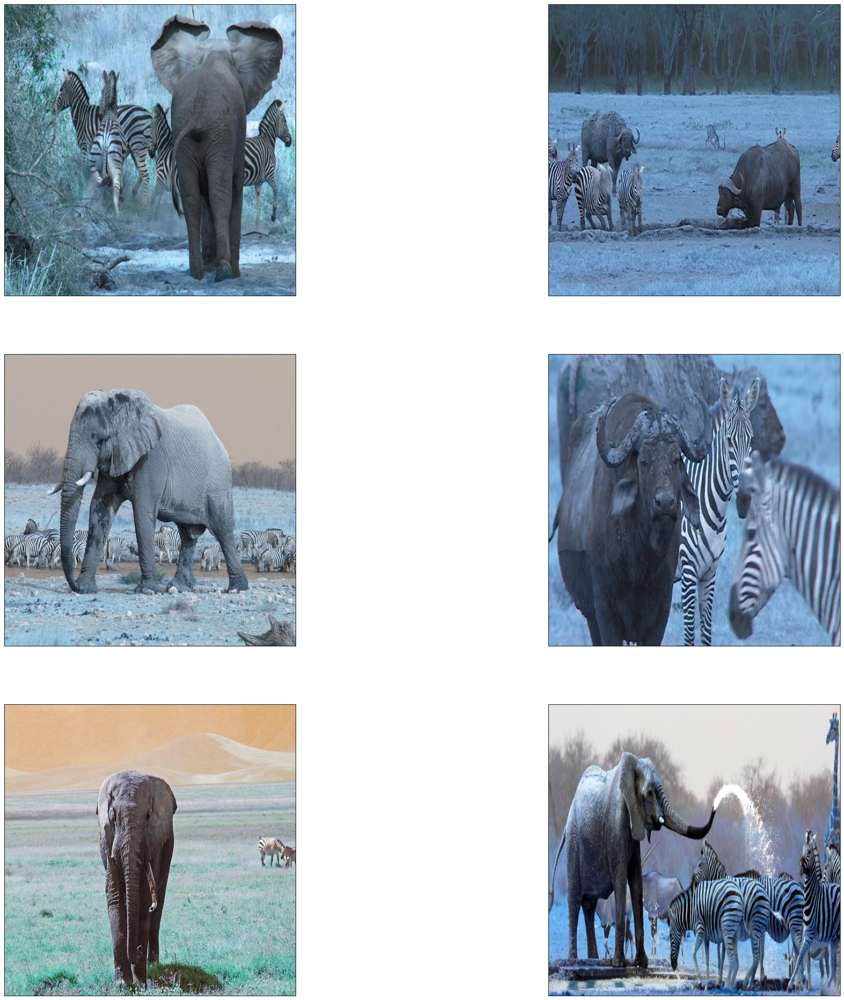

In [12]:
plt.figure(figsize=(30,30))
for i in range(6):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[i+3])
    ax=plt.subplot(3,2,i+1)

    # Display actual image
    plt.imshow(cv2.imread(test_image))
    plt.xticks([])
    plt.yticks([])

In [13]:
# Checking the size of test dataset
len(os.listdir(imgtestpath)), len(os.listdir(labeltestpath))

(18, 18)

In [14]:
# Checking the size of training(+validation) dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1486, 1486)

## Separating training and validation dataset

In [15]:
# moving 20% of data to validation

factor=0.2

for file in random.sample(os.listdir(imgtrainpath), int(len(os.listdir(imgtrainpath))*factor)):
    basename=os.path.splitext(file)[0]
    textfilename=basename+'.txt'
    labelfilepath=os.path.join(labeltrainpath, textfilename)
    labeldestpath=os.path.join(labelvalpath, textfilename)
    imgfilepath=os.path.join(imgtrainpath, file)
    imgdestpath=os.path.join(imgvalpath, file)
    shutil.move(imgfilepath, imgdestpath)
    shutil.move(labelfilepath, labeldestpath)

In [16]:
# Checking the size of training dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1189, 1189)

In [17]:
# Checking the size of validation dataset
len(os.listdir(imgvalpath)), len(os.listdir(labelvalpath))

(297, 297)

In [18]:
# function to obtain bounding box coordinates from text label files
def get_bbox_from_label(text_file_path):

    """
    Extracts bounding box coordinates from a label file and returns them as a list of vertices.

    Args:
    text_file_path (str): Path to the label text file.
    image_size (int): Size of the image (width and height are assumed to be equal).

    Returns:
    tuple: A tuple containing arrays of bounding box vertices.
    """
    bbox_list=[]
    with open(text_file_path, "r") as file:
        for line in file:
            class_id,x_centre,y_centre,width,height=line.strip().split(" ")
            x1=(float(x_centre)+(float(width)/2))*image_size
            x0=(float(x_centre)-(float(width)/2))*image_size
            y1=(float(y_centre)+(float(height)/2))*image_size
            y0=(float(y_centre)-(float(height)/2))*image_size

            vertices=np.array([[int(x0), int(y0)], [int(x1), int(y0)],
                               [int(x1),int(y1)], [int(x0),int(y1)]])
            bbox_list.append(vertices)
    return tuple(bbox_list)

In [19]:
# defining red color in RGB to draw bounding box
red=(255,0,0)

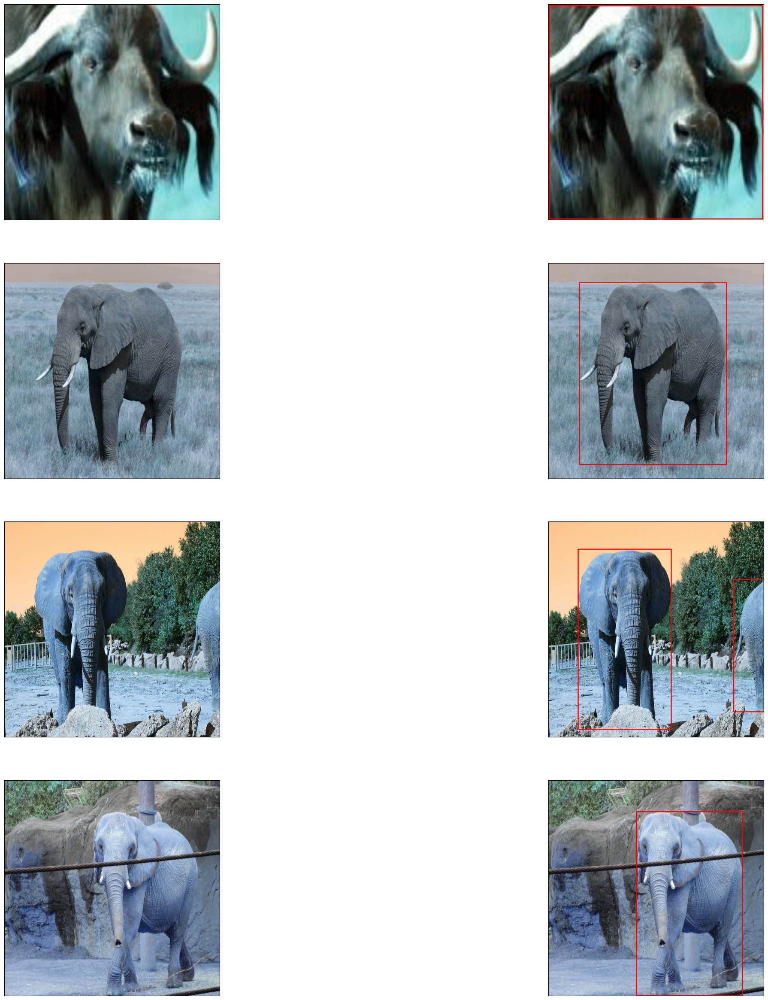

In [20]:
# Drawing bounding box for random images in training data
plt.figure(figsize=(30,30))
for i in range(1,8,2):
    k=random.randint(0, len(os.listdir(imgtrainpath))-1)
    img_path=os.path.join(imgtrainpath, sorted(os.listdir(imgtrainpath))[k])
    label_path=os.path.join(labeltrainpath, sorted(os.listdir(labeltrainpath))[k])
    bbox=get_bbox_from_label(label_path) # extracting bounding box coordinates
    image=cv2.imread(img_path)
    image_copy=copy.deepcopy(image)
    ax=plt.subplot(4, 2, i)
    plt.imshow(image) # displaying image
    plt.xticks([])
    plt.yticks([])
    cv2.drawContours(image_copy, bbox, -1, red, 2) # drawing bounding box on copy of image
    ax=plt.subplot(4, 2, i+1)
    plt.imshow(image_copy) # displaying image with bounding box
    plt.xticks([])
    plt.yticks([])

In [21]:
# defining newline variable for config file
newline='\n'

In [22]:
# Starting with a comment in config file
ln_1='# Train/val/test sets'+newline

# train, val and test path declaration
ln_2='train: ' +"'"+imgtrainpath+"'"+newline
ln_3='val: ' +"'" + imgvalpath+"'"+newline
ln_4='test: ' +"'" + imgtestpath+"'"+newline
ln_5=newline
ln_6='# Classes'+newline

# names of the classes declaration
ln_7='names:'+newline
ln_8='  0: buffalo'+newline
ln_9='  1: elephant'+newline
ln_10='  2: rhino'+newline
ln_11='  3: zebra'

config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11]

In [23]:
# Creating path for config file
config_path=os.path.join(curr_path, 'config.yaml')
config_path

'/content/config.yaml'

In [24]:
# Writing config file
with open(config_path, 'w') as f:
    f.writelines(config_lines)

In [25]:
# Using YOLO's pretrained model architecture and weights for training
model=YOLO('yolov8m.yaml').load('yolov8m.pt')

100%|██████████| 49.7M/49.7M [00:00<00:00, 580MB/s]


Transferred 475/475 items from pretrained weights


In [26]:
# Training the model
results=model.train(data=config_path, epochs=100, iou=0.5, conf=0.01)

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=0.01, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_bo

100%|██████████| 755k/755k [00:00<00:00, 96.7MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

wandb: Currently logged in as: ouedfao (faouzibrice). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 282MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/labels/train... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<00:00, 1264.08it/s]

train: New cache created: /content/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/labels/validation... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<00:00, 1157.16it/s]

val: New cache created: /content/labels/validation.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/75 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
      1/100      6.85G     0.8816      1.709      1.335         17        640: 100%|██████████| 75/75 [00:25<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.65it/s]

                   all        297        507       0.53      0.693      0.622      0.364



/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.82G      1.133      1.589      1.497         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.76it/s]

                   all        297        507      0.312      0.367      0.214      0.105



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       6.8G      1.233        1.6      1.583         13        640: 100%|██████████| 75/75 [00:22<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.381      0.392      0.329      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.77G      1.242      1.577      1.576         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.521      0.502      0.504      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.82G      1.188      1.471      1.525         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.562      0.354      0.433      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.71G      1.121      1.363      1.472         25        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.744      0.635      0.723      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       6.8G      1.067      1.265      1.441         25        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.738      0.693      0.774      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.78G      1.059       1.22      1.443         25        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.821      0.683      0.804      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.82G      1.029      1.202      1.425         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.822      0.749      0.833      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100       6.7G      1.024      1.161       1.42         18        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.795      0.736       0.82      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.79G     0.9853      1.099      1.364         23        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        297        507      0.907      0.783      0.899       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.79G     0.9527      1.061      1.347         20        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.809      0.808      0.869      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.82G     0.9519       1.08      1.362         22        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507       0.88      0.837      0.906      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.72G     0.9155     0.9932      1.333         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.853      0.814      0.898      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.79G     0.9069     0.9659      1.323         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.875      0.797      0.891      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.77G     0.9191     0.9832      1.328         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.853      0.798      0.883      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.81G     0.8947     0.9436      1.327         18        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.864      0.826      0.919      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100       6.7G     0.8902     0.9465      1.328         12        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        297        507      0.866      0.761      0.859       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       6.8G     0.8778     0.9421      1.315         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.917      0.838      0.928      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.78G     0.8357     0.9122      1.277         12        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.916      0.802       0.92       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.82G     0.8249     0.8491      1.259         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.899      0.863      0.942      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.71G     0.8279      0.874      1.271         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.895      0.861      0.924      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.79G     0.8297     0.8385      1.268         20        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507       0.87      0.857      0.921      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.78G     0.8292     0.8524      1.263         26        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.934      0.861      0.949      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.83G     0.8113     0.8095      1.264         34        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.836      0.842      0.914       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.71G     0.7842     0.7954      1.248         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507       0.91      0.849      0.932      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.79G     0.8043     0.7912      1.246         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        297        507      0.881      0.886      0.937      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.79G     0.7973     0.8235      1.257         21        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.70it/s]

                   all        297        507      0.922      0.873      0.936       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.83G     0.7855     0.7811      1.231         18        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.946      0.907       0.96      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.72G     0.7775     0.7726      1.234         13        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507       0.92      0.849      0.946      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       6.8G     0.7709     0.7676      1.227         18        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.902      0.901      0.947      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.78G     0.7534     0.7508      1.217         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.874      0.874      0.933      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       6.8G     0.7366      0.724      1.202         26        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.62it/s]

                   all        297        507      0.936      0.899      0.956      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.71G     0.7481     0.7519      1.215         10        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.921      0.853      0.949      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.81G     0.7322     0.7333      1.191         14        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.916      0.885      0.945      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.79G     0.7379      0.716      1.207         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.896      0.878      0.937      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.82G     0.7279     0.6879       1.19         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.925       0.85      0.937       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.72G     0.7197     0.6892      1.189         29        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.914      0.901      0.952       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       6.8G     0.7128     0.6838      1.183         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.933      0.896      0.954      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.78G     0.7212     0.6554      1.189         13        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.944      0.903       0.96      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.82G     0.7115     0.6619      1.188         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.954      0.906       0.97      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.71G      0.714     0.6806      1.181         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.925      0.896      0.956       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.79G      0.702     0.6467       1.18         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.938      0.892      0.957      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.79G     0.6981     0.6396      1.166         22        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.941      0.907      0.966      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.81G     0.6867     0.6306      1.169         21        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.951      0.884      0.962      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       6.7G     0.6904     0.6505      1.174         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.922      0.921      0.966      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.79G     0.6748     0.6577      1.161         12        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.934      0.896       0.95      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.78G     0.6704     0.6225      1.161         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.58it/s]

                   all        297        507      0.955      0.893      0.968      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.82G     0.6769     0.6111      1.164         24        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.932      0.892      0.959      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.71G     0.6572     0.6156      1.137         22        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.70it/s]

                   all        297        507      0.945      0.908      0.966      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       6.8G      0.655      0.582      1.153         18        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.938      0.915      0.961      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       6.8G     0.6459     0.5715      1.137         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.62it/s]

                   all        297        507      0.947      0.921       0.97      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.82G     0.6632     0.5943      1.147         29        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.937      0.907      0.964      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.71G     0.6553     0.5749      1.133         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.945      0.945      0.975      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.79G     0.6454      0.597      1.147         23        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.925      0.906      0.958      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.77G     0.6297     0.5736      1.134         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.947      0.907      0.972      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.83G     0.6207     0.5674      1.126         14        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.937      0.877      0.958       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.71G     0.6186     0.5457      1.122         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.958      0.921      0.971      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       6.8G     0.6181     0.5388      1.128         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.973      0.892      0.965      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.78G     0.6318     0.5543      1.124         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.943       0.92      0.968      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.82G     0.6093     0.5252      1.109         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507       0.95      0.911      0.963      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.72G     0.5823     0.5371      1.099         19        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507      0.968      0.911      0.967      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       6.8G     0.6106     0.5238      1.115         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.956      0.914      0.971       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.77G     0.6081     0.5227       1.11         43        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.954      0.938      0.973      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.81G     0.5926     0.5384      1.113         13        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.968      0.919      0.972      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.71G     0.5885     0.5124      1.102         22        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507       0.96      0.935      0.976      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       6.8G     0.5984     0.5241      1.116         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507       0.97      0.913      0.971      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.77G     0.5884     0.5268      1.113         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.944      0.926      0.968      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       6.8G     0.5955     0.5073      1.114         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.947      0.924      0.969      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       6.7G     0.5796     0.5044      1.102         23        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.67it/s]

                   all        297        507      0.937      0.925      0.965      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       6.8G     0.5895     0.5156      1.109         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.71it/s]

                   all        297        507      0.947      0.932      0.975      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.78G     0.5654      0.485      1.084         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.70it/s]

                   all        297        507      0.947      0.912      0.968      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.82G       0.57     0.4956      1.097         20        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.71it/s]

                   all        297        507      0.947       0.94      0.974      0.844



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.71G     0.5778     0.4925      1.098         25        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        297        507      0.962      0.919      0.972      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.79G     0.5568     0.4889       1.08         21        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.933       0.94       0.97       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.78G     0.5438     0.4592      1.075         12        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.961      0.912      0.973      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.82G     0.5604     0.4683      1.087         21        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.70it/s]

                   all        297        507       0.96      0.928      0.971      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.71G     0.5601     0.4611      1.085         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.958      0.942      0.976      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.81G      0.555     0.4657      1.076         29        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.69it/s]

                   all        297        507      0.948      0.942      0.969      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.79G     0.5498     0.4643      1.071         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507       0.96      0.911      0.971      0.846



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.81G      0.538     0.4476      1.068         38        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.71it/s]

                   all        297        507      0.968      0.933      0.979      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.72G     0.5319      0.449      1.069         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.62it/s]

                   all        297        507      0.938      0.937      0.979      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.81G     0.5367     0.4339      1.066         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.952      0.945      0.979      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.78G     0.5182     0.4312      1.057         12        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.959      0.923      0.975      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.82G     0.5217      0.426      1.057         17        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.955      0.936      0.971      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.71G     0.5208     0.4261      1.061         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.958      0.932       0.97       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.79G     0.5162     0.4154       1.06         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        297        507      0.962      0.933      0.971       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.78G     0.5103     0.4111       1.05         15        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.964      0.937      0.981      0.854



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.81G     0.5022     0.3994      1.049         16        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.68it/s]

                   all        297        507      0.967      0.928      0.975      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       6.7G     0.5137     0.4168      1.063         27        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        297        507       0.95      0.928      0.971      0.861


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.79G     0.3618     0.2592     0.9422         16        640: 100%|██████████| 75/75 [00:23<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        297        507       0.96       0.93      0.974      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.79G     0.3493      0.241     0.9359          5        640: 100%|██████████| 75/75 [00:22<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        297        507      0.944       0.93      0.975      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.82G     0.3498     0.2384     0.9406          5        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.65it/s]

                   all        297        507       0.97      0.896      0.973      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.72G     0.3448     0.2365      0.926          7        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.59it/s]

                   all        297        507       0.92      0.953      0.971      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.79G     0.3323     0.2266     0.9176         11        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.951      0.943      0.973      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.77G     0.3324     0.2245     0.9239          8        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]

                   all        297        507      0.961      0.933      0.975      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.81G     0.3227     0.2188     0.9095          7        640: 100%|██████████| 75/75 [00:22<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.63it/s]

                   all        297        507      0.945      0.942      0.971       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       6.7G     0.3238     0.2166     0.9103          5        640: 100%|██████████| 75/75 [00:22<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        297        507      0.945      0.932      0.972      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.79G     0.3192     0.2147     0.9132          7        640: 100%|██████████| 75/75 [00:22<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.61it/s]

                   all        297        507      0.948      0.928      0.974       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.78G     0.3193     0.2162     0.9164          8        640: 100%|██████████| 75/75 [00:22<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.64it/s]

                   all        297        507      0.948      0.932      0.973       0.86



100 epochs completed in 0.741 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv8m summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]


                   all        297        507       0.95      0.927      0.971      0.861
               buffalo         65         89      0.937      0.955      0.972      0.897
              elephant         71        132      0.984      0.919      0.975      0.844
                 rhino         77        107       0.98      0.933      0.986      0.903
                 zebra         84        179      0.899      0.899       0.95        0.8
Speed: 0.2ms preprocess, 5.4ms inference, 0.0ms loss, 6.7ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▄▁▅▆▇▇▇▇█▇▇█████████████████████████████
metrics/mAP50-95(B),▃▁▄▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████████████
metrics/precision(B),▃▁▅▆▇▇▇▇▇▇▇▇▇▇▇███▇██████████████████▇██
metrics/recall(B),▅▁▄▅▆▇▆▆▇▇▇▇▇▇▇▇▇▇█▇██▇▇▇███▇███████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▅█▇▇▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▃▃▃▂▁▁▁▁


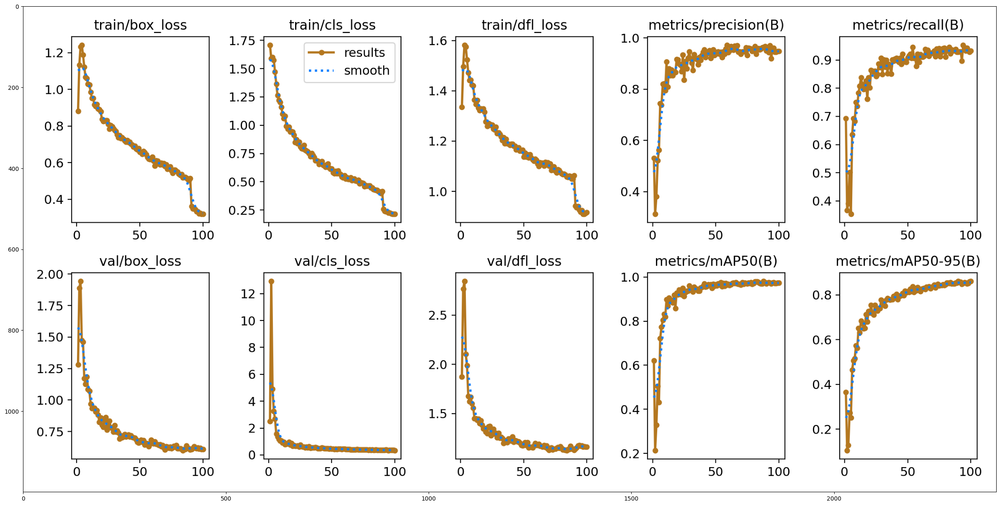

In [27]:
plt.figure(figsize=(30,30))
trainingresult_path=os.path.join(curr_path, 'runs', 'detect', 'train')
results_png=cv2.imread(os.path.join(trainingresult_path,'results.png'))
plt.imshow(results_png)

# 2. Model Performance

In [28]:
# function for evaluating model metrics map50
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    print(metrics)
    map50=round(metrics.box.map50, 3)
    print("The mAP of model for all images on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [29]:
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50, 50))

    image_filenames = ['P_curve.png', 'R_curve.png', 'PR_curve.png', 'F1_curve.png', 'confusion_matrix.png']

    # Titles for the subplots
    titles = ['P Curve', 'R Curve', 'PR Curve', 'F1 Curve', 'Confusion Matrix']

    for i, filename in enumerate(image_filenames):
        img_path = os.path.join(root_path, filename)
        image = cv2.imread(img_path)


        # Convert image from BGR to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax = plt.subplot(5, 1, i+1)
        plt.imshow(image_rgb)
        plt.title(titles[i])
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [30]:
# Evaluating train metrics
train_metrics, train_map50=evaluate_map50(model, config_path, dataset='train')

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv8m summary (fused): 218 layers, 25842076 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/labels/train.cache... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  99%|█████████▊| 74/75 [00:17<00:00,  4.68it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:18<00:00,  4.15it/s]


                   all       1189       2106      0.991      0.991      0.995      0.955
               buffalo        305        443      0.992          1      0.995      0.966
              elephant        301        603      0.988      0.991      0.995      0.948
                 rhino        292        447      0.996      0.993      0.995      0.974
                 zebra        291        613      0.987      0.979      0.994      0.933
Speed: 0.2ms preprocess, 9.8ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e3025e2b790>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,  

In [31]:
# Path storing model's performance on training dataset
train_path=os.path.join(curr_path, 'runs', 'detect', 'train2')

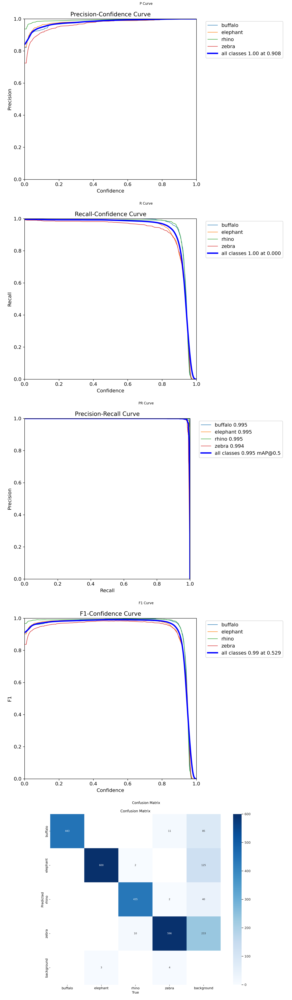

In [32]:
# Display plots on training data
display_curves(train_path)


In [33]:
# Evaluating val metrics
val_metrics, val_map50=evaluate_map50(model, config_path, dataset='val')

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)


val: Scanning /content/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.07it/s]


                   all        297        507       0.95      0.928      0.971       0.86
               buffalo         65         89      0.936      0.955      0.972      0.897
              elephant         71        132      0.984       0.92      0.975      0.842
                 rhino         77        107       0.98      0.933      0.986      0.901
                 zebra         84        179      0.898      0.905       0.95        0.8
Speed: 0.2ms preprocess, 9.6ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to runs/detect/train3
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e30744d1090>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,  

In [34]:
# Path storing model's performance on validation dataset
val_path=os.path.join(curr_path, 'runs', 'detect', 'train3')

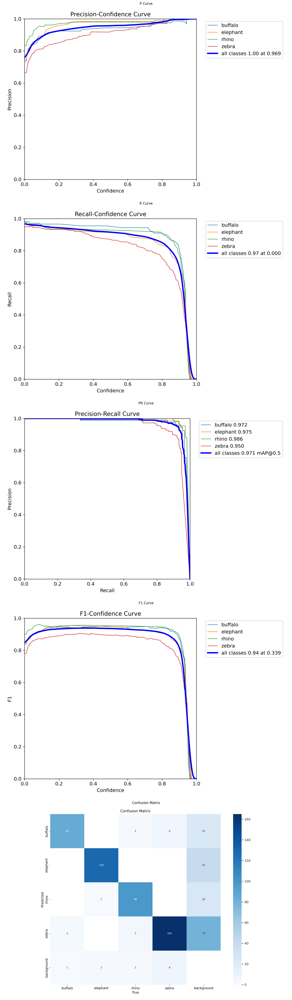

In [35]:
# Display plots on validation data
display_curves(val_path)

In [36]:
# Evaluating test metrics
test_metrics, test_map50=evaluate_map50(model, config_path, dataset='test')

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)


val: Scanning /content/labels/test... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:00<00:00, 1686.00it/s]

val: New cache created: /content/labels/test.cache



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:00<00:00,  1.62it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.07it/s]


                   all         18         72      0.796      0.811      0.864      0.719
               buffalo          9         22      0.806      0.682       0.83      0.663
              elephant         11         13      0.745      0.923      0.949      0.888
                 rhino          3          5      0.885        0.8      0.855      0.773
                 zebra         14         32      0.749      0.839      0.822      0.554
Speed: 0.2ms preprocess, 57.5ms inference, 0.0ms loss, 21.5ms postprocess per image
Results saved to runs/detect/train4
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e304c274a90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,

In [37]:
# Path storing model's performance on test dataset
test_path=os.path.join(curr_path, 'runs', 'detect', 'train4') #train3 is a misnomer, it is actually measuring validation on test dataset

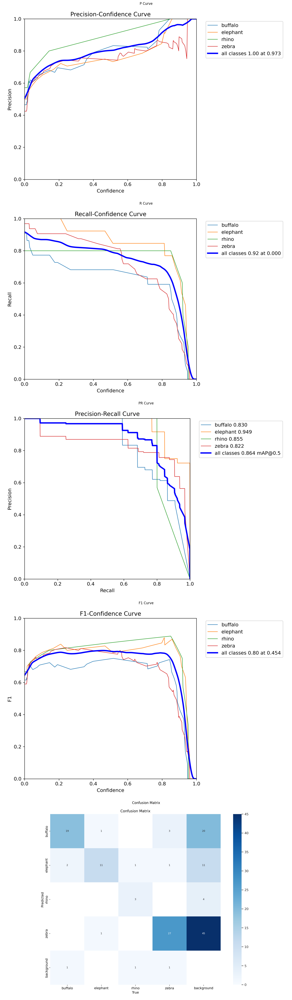

In [38]:
# Display plots on test data
display_curves(test_path)


image 1/1 /content/images/test/rhino_375.jpg: 640x640 4 buffalos, 3 elephants, 2 rhinos, 12.1ms
Speed: 2.9ms preprocess, 12.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


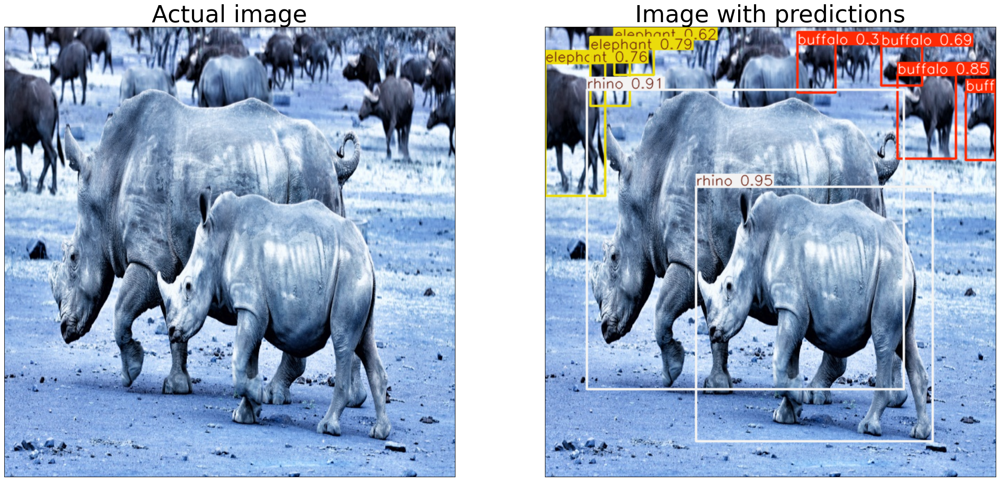

In [66]:
plt.figure(figsize=(30,30))
m=random.randint(0, 17) # Selecting random image number from 18 images in test dataset
for i in range(1,2,2):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[m])

    ax=plt.subplot(1,2,i)

    # Display actual image
    plt.imshow(cv2.imread(test_image))
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)

    # Predict
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(1,2,i+1)

    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    m=m+1

In [40]:
model_path = os.path.join(curr_path, 'yolov8m_trained.pt')
model.save(model_path)
print(f'Model saved to {model_path}')

Model saved to /content/yolov8m_trained.pt


Determining workspace structure

Deciding which workspace information to collect

Gathering workspace info

# Yolo Wildlife Detection

This project uses the YOLO (You Only Look Once) model for real-time animal detection in nature reserves. The model is trained on an African wildlife dataset.

## Project Structure



In [ ]:
app.py
flagged/
gradio_app.py
results/
test.py
training/
yolo_wildlife.ipynb
yolov8m_trained.pt



## Key Files

- [`app.py`](command:_github.copilot.openSymbolInFile?%5B%22app.py%22%2C%22app.py%22%5D "app.py"): This is the main application file. It initializes the YOLO model and sets up a FastAPI server for handling image upload and prediction requests.

- [`gradio_app.py`](command:_github.copilot.openSymbolInFile?%5B%22gradio_app.py%22%2C%22gradio_app.py%22%5D "gradio_app.py"): This file sets up a Gradio interface for the application. It allows users to upload images and view the prediction results.

- [`test.py`](command:_github.copilot.openSymbolInFile?%5B%22test.py%22%2C%22test.py%22%5D "test.py"): This script tests the prediction endpoint of the FastAPI server.

- [`yolo_wildlife.ipynb`](command:_github.copilot.openSymbolInFile?%5B%22yolo_wildlife.ipynb%22%2C%22yolo_wildlife.ipynb%22%5D "yolo_wildlife.ipynb"): This Jupyter notebook contains the code for training the YOLO model.

- [`yolov8m_trained.pt`](command:_github.copilot.openSymbolInFile?%5B%22yolov8m_trained.pt%22%2C%22yolov8m_trained.pt%22%5D "yolov8m_trained.pt"): This is the trained YOLO model.

## Usage

To run the FastAPI server, execute the following command:



In [ ]:
python app.py



To launch the Gradio interface, execute the following command:



In [ ]:
python gradio_app.py



To test the prediction endpoint of the FastAPI server, execute the following command:



In [ ]:
python test.py



## Contact

For any questions or concerns, please reach out to [OUEDRAOGO FAOUZI BRICE PhD](https://www.linkedin.com/in/faouzi-brice-ouedraogo-ph-d-879671236/). You can also check out the project on [GitHub](https://github.com/HbkFaouzi).